In [120]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, KFold, cross_val_score
import plotly.express as px
import matplotlib.pyplot as plt
import warnings
from sklearn.exceptions import ConvergenceWarning
import seaborn as sns
from sklearn.linear_model import Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import IsolationForest

warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [121]:
df = pd.read_csv('https://www.dropbox.com/scl/fi/jcjyh1kya0lzcokmc9qtr/new.csv?rlkey=opszmhuggtq36hn1gqb1j9zpk&dl=1', encoding = "gbk")

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3720734345.py:1: DtypeWarning:

Columns (1,11,12,14) have mixed types. Specify dtype option on import or set low_memory=False.



# Feature Engineering and Data Preprocessing 

In [122]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318851 entries, 0 to 318850
Data columns (total 26 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   url                  318851 non-null  object 
 1   id                   318851 non-null  object 
 2   Lng                  318851 non-null  float64
 3   Lat                  318851 non-null  float64
 4   Cid                  318851 non-null  int64  
 5   tradeTime            318851 non-null  object 
 6   DOM                  160874 non-null  float64
 7   followers            318851 non-null  int64  
 8   totalPrice           318851 non-null  float64
 9   price                318851 non-null  int64  
 10  square               318851 non-null  float64
 11  livingRoom           318851 non-null  object 
 12  drawingRoom          318851 non-null  object 
 13  kitchen              318851 non-null  int64  
 14  bathRoom             318851 non-null  object 
 15  floor            

In [123]:
df.drop(["url", "id"], axis=1, inplace=True)

In [124]:
print('data+++++++++++++++++++++')
for i in np.arange(df.shape[1]):
    n = df.iloc[:,i].isnull().sum()
    if n > 0:
        print(list(df.columns.values)[i] + ': ' + str(n) + ' nans')

data+++++++++++++++++++++
DOM: 157977 nans
buildingType: 2021 nans
elevator: 32 nans
fiveYearsProperty: 32 nans
subway: 32 nans
communityAverage: 463 nans


In [125]:
df['buildingType'].fillna(df['buildingType'].mode()[0], inplace=True)
df['elevator'].fillna(df['elevator'].mode()[0], inplace=True)
df['fiveYearsProperty'].fillna(df['fiveYearsProperty'].mode()[0], inplace=True)
df['subway'].fillna(df['subway'].mode()[0], inplace=True)
df['communityAverage'].fillna(df.groupby("Cid")['communityAverage'].transform('mean'), inplace=True)
df['communityAverage'].fillna(df.groupby("district")['communityAverage'].transform('mean'), inplace=True)
df['DOM'].fillna(df['DOM'].mode()[0], inplace=True)

In [126]:
nan_indices = df[df['DOM'].isnull()].index
"""df_DOM = df.loc[~df.index.isin(nan_indices)]"""
df_DOM = df
df_NDOM = df.loc[nan_indices].drop(columns=['DOM'])

In [127]:
print('df_DOM data+++++++++++++++++++++')
for i in np.arange(df_DOM.shape[1]):
    n = df_DOM.iloc[:,i].isnull().sum()
    if n > 0:
        print(list(df_DOM.columns.values)[i] + ': ' + str(n) + ' nans')

df_DOM data+++++++++++++++++++++


In [128]:
print((df_DOM['constructionTime'] == '未知').sum())
print((df_DOM['livingRoom']=='#NAME?').sum())

19283
32


In [129]:
df_DOM['constructionTime'] = df_DOM['constructionTime'].replace('未知', df_DOM['constructionTime'].mode()[0])
df_DOM['livingRoom'] = df_DOM['livingRoom'].replace('#NAME?', df_DOM['livingRoom'].mode()[0])

In [130]:
df_DOM["floortype"] = [i[0] for i in df_DOM["floor"]]
df_DOM["floortype"].value_counts()

floortype
中    119832
高     70094
低     64136
顶     37406
底     26080
未      1271
钢        17
混        15
Name: count, dtype: int64

In [131]:
floor_list = []
for strings in df_DOM["floor"]:
    floor = ""
    for char in strings:
        if char.isdigit():
            floor += char
    floor_list.append(floor)
df_DOM["floor"] = floor_list

In [132]:
year_list = list()
month_list = list()
day_list = list()
for string in df_DOM["tradeTime"]:
    year_list.append(string[0:4])
    month_list.append(string[5:7])
    day_list.append(string[8:10])
df_DOM['tradeYear'] = year_list
df_DOM['tradeMonth'] = month_list
df_DOM['tradeDay'] = day_list
df_DOM = df_DOM.astype({
    "tradeYear": "int64",
    "tradeMonth": "int64",
    "tradeDay": "int64",
})
df_DOM.drop('tradeTime', axis=1,inplace=True)

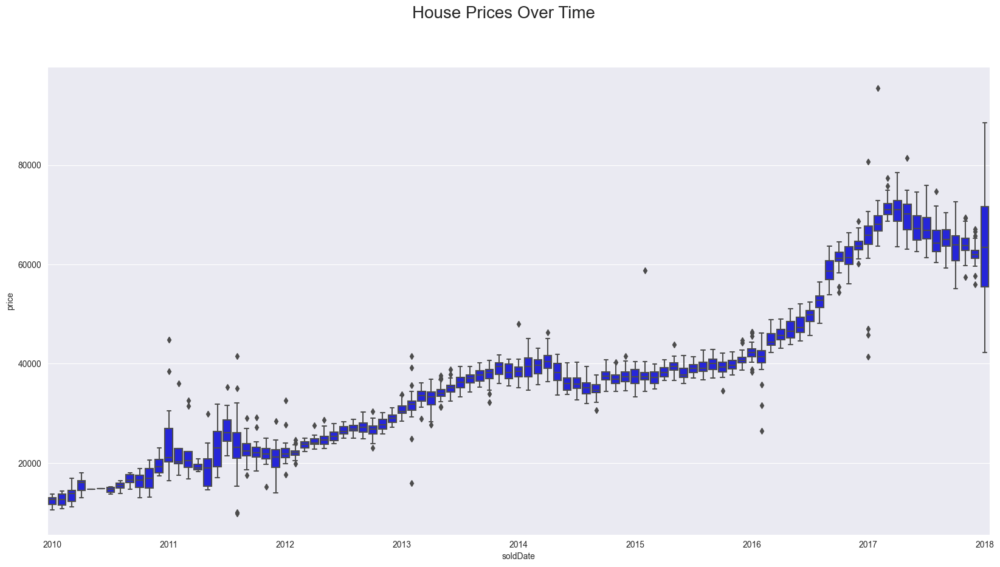

In [133]:
dt = df_DOM.groupby(['tradeYear', 'tradeMonth', 'tradeDay'])['price'].mean().reset_index()
dt.drop(dt[dt['tradeYear']<2010].index, inplace=True) # the years prior to 2010 only have a few points, while the ones after have at least one for every month
dt['soldDate'] = list(zip(dt.tradeYear, dt.tradeMonth))
dt.reset_index(inplace=True)

fig = plt.figure(figsize=(20,10))
fig.suptitle('House Prices Over Time', fontsize=20)
sns.boxplot(data=dt, x='soldDate',y='price', color="b", saturation=0.7)
plt.xticks(np.arange(0, len(dt['soldDate'].unique()), 12), labels=range(2010, 2018+1))
plt.show()

In [134]:
!pip install lets_plot
import geopandas as gpd
from lets_plot import *

LetsPlot.setup_html()
LetsPlot.set(maptiles_lets_plot(theme="dark"))


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [135]:
city_blocks = gpd.read_file("https://github.com/alshan/china-city-blocks/raw/main/output/beijing_city_blocks_2016.geojson")
city_blocks["block_id"] = [i for i in range(0, city_blocks.shape[0])]
df_gdf = gpd.GeoDataFrame(df_DOM,
                        geometry=gpd.points_from_xy(df_DOM.Lng,
                                                    df_DOM.Lat,
                                                    crs="EPSG:4326")).reset_index(drop=True)
df_block_id = gpd.sjoin(df_gdf,
                                      city_blocks[["block_id", "geometry"]],
                                      how="inner", predicate='within').reset_index(drop=True)
df_block_price = df_block_id[[
    'price',
    'district',
    'block_id']].groupby("block_id").mean('price').reset_index()
df_block_price_with_geom = pd.merge(df_block_price, city_blocks, on="block_id", how="inner")
df_block_price_with_geom = gpd.GeoDataFrame(df_block_price_with_geom)

In [136]:
(ggplot() +
 geom_livemap(zoom=11) +
 geom_polygon(aes(fill="price"),
              size=0.1,
              alpha=0.7,
              data=df_block_price_with_geom,
              tooltips=layer_tooltips()
              .title("District @district")
              .line("Price per square|@price")
              .format("district", ".0d").format("price", ".0d")) +
 scale_fill_brewer(palette="Reds") +
 ggsize(800, 655)
)

In [137]:
df_DOM['disTianAnMen'] = ((df_DOM['Lng']-116.3881)**2+(df_DOM['Lat']-39.9075)**2)**(1/2)
df_DOM['disTianTan'] = ((df_DOM['Lng']-116.4128)**2+(df_DOM['Lat']-39.8837)**2)**(1/2)
df_DOM['disGuoMao'] = ((df_DOM['Lng']-116.4667)**2+(df_DOM['Lat']-39.9141)**2)**(1/2)
df_DOM['disXinJieKou'] = ((df_DOM['Lng']-116.3714)**2+(df_DOM['Lat']-39.9443)**2)**(1/2)
df_DOM['disSanLiTun'] = ((df_DOM['Lng']-116.4480)**2+(df_DOM['Lat']-39.9372)**2)**(1/2)
df_DOM['disYaYunCun'] = ((df_DOM['Lng']-116.4098)**2+(df_DOM['Lat']-39.9850)**2)**(1/2)
df_DOM['disChaoYangPark'] = ((df_DOM['Lng']-116.4823)**2+(df_DOM['Lat']-39.9344)**2)**(1/2)

D:\Python\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning:

overflow encountered in expm1



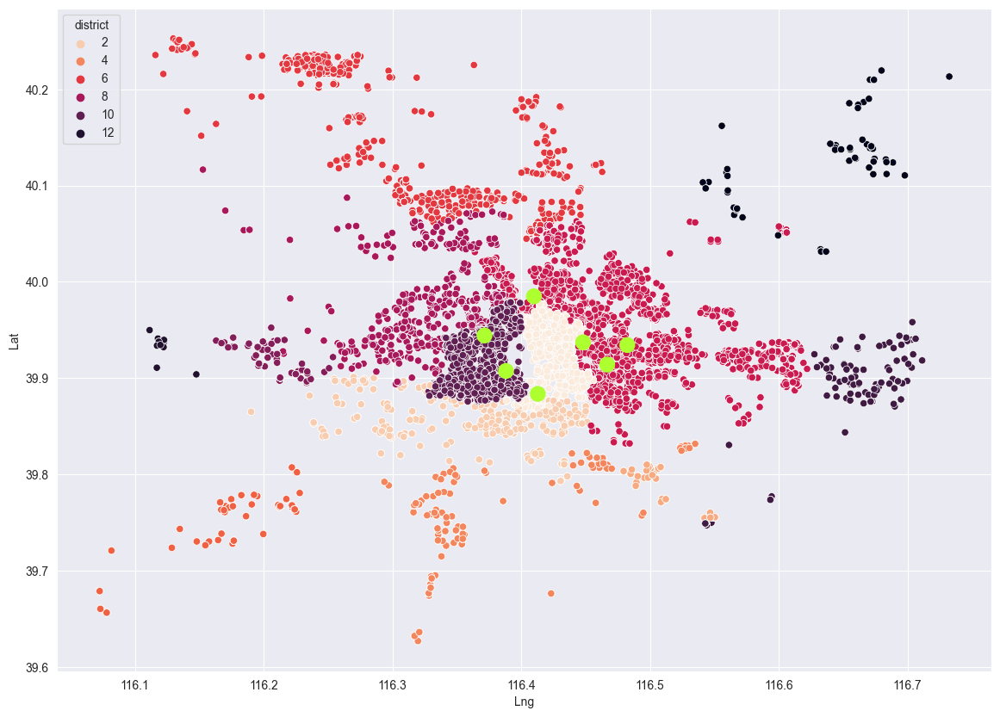

In [138]:
plt.figure(figsize=(14,10))
df_DOM['pricePerSquare'] = df_DOM['totalPrice'] / np.expm1(df_DOM['square'])
sns.scatterplot(x='Lng', y='Lat', hue='district', palette='rocket_r', data=df_DOM)
df_DOM.drop('pricePerSquare', axis=1, inplace=True)
plt.scatter(x=[116.3881, 116.4128, 116.4667, 116.3714, 116.4480, 116.4098, 116.4823], y=[39.9075, 39.8837, 39.9141, 39.9443, 39.9372, 39.9850, 39.9344], sizes=[150,150,150,150],color='greenyellow')

In [139]:
df_DOM.rename({
    'floortype_高':'floortype_high',
    'floortype_中':'floortype_medium',
    'floortype_低':'floortype_low',
    'floortype_顶':'floortype_top',
    'floortype_底':'floortype_bottom',
    'floortype_未':'floortype_wei',
    'floortype_钢':'floortype_gang',
    'floortype_混':'floortype_hun',
})

,Lng,Lat,Cid,DOM,followers,totalPrice,price,square,livingRoom,drawingRoom,...,tradeYear,tradeMonth,tradeDay,disTianAnMen,disTianTan,disGuoMao,disXinJieKou,disSanLiTun,disYaYunCun,disChaoYangPark
0,116.475489,40.019520,1111027376244,1464.0,106,415.0,31680,131.00,2,1,...,2016,8,9,0.142075,0.149589,0.105786,0.128423,0.086788,0.074207,0.085392
1,116.453917,39.881534,1111027381879,903.0,126,575.0,43436,132.38,2,2,...,2016,7,28,0.070754,0.041174,0.034985,0.103676,0.055980,0.112479,0.060003
2,116.561978,39.877145,1111040862969,1271.0,48,1030.0,52021,198.00,3,2,...,2016,12,11,0.176508,0.149322,0.102194,0.202064,0.128832,0.186523,0.098116
3,116.438010,40.076114,1111043185817,965.0,138,297.5,22202,134.00,3,1,...,2016,9,30,0.175846,0.194058,0.164535,0.147688,0.139273,0.095381,0.148474
4,116.428392,39.886229,1111027381174,927.0,286,392.0,48396,81.00,2,1,...,2016,8,28,0.045562,0.015796,0.047374,0.081365,0.054612,0.100506,0.072295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318846,116.546899,39.755236,1111027377053,1.0,8,350.0,20580,170.07,3,2,...,2016,6,10,0.220003,0.185703,0.177960,0.257963,0.207104,0.267559,0.190454
318847,116.497474,39.810115,1111027377957,1.0,1,108.8,31006,35.09,1,0,...,2016,6,10,0.146446,0.112180,0.108443,0.184120,0.136375,0.195631,0.125208
318848,116.497256,39.804081,1111027380056,1.0,2,359.0,35138,102.17,2,2,...,2016,6,5,0.150368,0.116069,0.114183,0.188417,0.141940,0.200948,0.131174
318849,116.501794,39.799347,1111027377054,1.0,4,720.0,40373,178.34,4,2,...,2016,6,12,0.156918,0.122619,0.119999,0.194972,0.147977,0.207195,0.136453


In [140]:
numeric_features = df_DOM.dtypes[df_DOM.dtypes != 'object'].index
skewed_features = df_DOM[numeric_features].apply(lambda x: x.skew()).sort_values(ascending=False)
high_skew = skewed_features[abs(skewed_features) > 1]
high_skew

ladderRatio         399.279351
Cid                 342.924424
followers             6.249823
DOM                   5.899562
totalPrice            4.719374
square                2.267426
price                 1.302865
communityAverage      1.030541
disXinJieKou          1.025365
kitchen              -2.167032
dtype: float64

In [141]:
df_DOM['totalPrice'] = np.log(df_DOM['totalPrice'])
df_DOM['followers'] = np.log1p(df_DOM['followers'])
df_DOM['DOM'] = np.log(df_DOM['DOM'])
df_DOM['square'] = np.log(df_DOM['square'])
df_DOM['communityAverage'] = np.log(df_DOM['communityAverage'])

In [142]:
df_DOM = df_DOM.astype({
    "floor": "object",
    "buildingType": "object",
    "constructionTime": "int64",
    "renovationCondition": "object",
    "buildingStructure": "object",
    "elevator": "object",
    "fiveYearsProperty": "object",
    "subway": "object",
    "district": "object",
})

In [143]:
df_dummies = pd.get_dummies(df_DOM['tradeMonth'], prefix='month')
df_DOM = pd.concat([df_DOM, df_dummies], axis=1)
df_DOM['lnprice'] = np.log(df_DOM['price'])

In [144]:
df_DOM = pd.get_dummies(df_DOM)

In [145]:
df_DOM['tradetime'] = pd.to_datetime(df_DOM[['tradeYear', 'tradeMonth', 'tradeDay']].astype(str).agg('-'.join, axis=1))
breakpoint1 = pd.Timestamp('2017-03-17')
breakpoint2 = pd.Timestamp('2017-04-17')
breakpoint3 = pd.Timestamp('2017-05-17')

In [146]:
df_DOM['policy'] = (df_DOM['tradetime'] >= pd.Timestamp('2017-03-17')).astype(int)
df_DOM['policy_lag_1_month'] = (df_DOM['tradetime'] >= pd.Timestamp('2017-04-17')).astype(int)
df_DOM['policy_lag_2_month'] = (df_DOM['tradetime'] >= pd.Timestamp('2017-05-17')).astype(int)
df_DOM['day_1'] = (df_DOM['tradetime'] - breakpoint1).dt.days
df_DOM['day_2'] = (df_DOM['tradetime'] - breakpoint2).dt.days
df_DOM['day_3'] = (df_DOM['tradetime'] - breakpoint3).dt.days

In [147]:
df_DOM.head(5)

,Lng,Lat,Cid,DOM,followers,totalPrice,price,square,kitchen,constructionTime,...,floortype_钢,floortype_顶,floortype_高,tradetime,policy,policy_lag_1_month,policy_lag_2_month,day_1,day_2,day_3
0,116.475489,40.019520,1111027376244,7.288928,4.672829,6.028279,31680,4.875197,1,2005,...,False,False,True,2016-08-09,0,0,0,-220,-251,-281
1,116.453917,39.881534,1111027381879,6.805723,4.844187,6.354370,43436,4.885677,1,2004,...,False,False,True,2016-07-28,0,0,0,-232,-263,-293
2,116.561978,39.877145,1111040862969,7.147559,3.891820,6.937314,52021,5.288267,1,2005,...,False,False,False,2016-12-11,0,0,0,-96,-127,-157
3,116.438010,40.076114,1111043185817,6.872128,4.934474,5.695414,22202,4.897840,1,2008,...,False,False,False,2016-09-30,0,0,0,-168,-199,-229
4,116.428392,39.886229,1111027381174,6.831954,5.659482,5.971262,48396,4.394449,1,1960,...,False,False,False,2016-08-28,0,0,0,-201,-232,-262


## LOWESS for the First  Cutoff

In [148]:
bandwidth = pd.DateOffset(months=6)
bandwidth_above = pd.DateOffset(months=6)
above_indices = df_DOM[
    (df_DOM['tradetime'] > breakpoint1) & (df_DOM['tradetime'] <= breakpoint1 + bandwidth_above)].index
below_indices = df_DOM[
    (df_DOM['tradetime'] < breakpoint1) & (df_DOM['tradetime'] >= breakpoint1 - bandwidth)].index

In [149]:
print(len(above_indices))
print(len(below_indices))

14558
36726


In [150]:
mua = df_DOM.loc[above_indices, 'price'].mean()
mub = df_DOM.loc[below_indices, 'price'].mean()
te = mua - mub
vara = df_DOM.loc[above_indices, 'price'].var()
varb = df_DOM.loc[below_indices, 'price'].var()
sdte = np.sqrt(vara / len(above_indices) + varb / len(below_indices))
confidence_interval = [te - 2 * sdte, te + 2 * sdte]
print("mua (above) = ", mua, "mub (below) = ", mub)
print("Treatment Effect:", te)
print("Confidence Interval:", confidence_interval)

mua (above) =  68318.74392086825 mub (below) =  64994.21526983608
Treatment Effect: 3324.5286510321675
Confidence Interval: [2849.0065207151406, 3800.0507813491945]


In [151]:
import plotly.graph_objects as go
import numpy as np

#
fit_below = sm.nonparametric.lowess(df_DOM.loc[below_indices, 'price'],
                                    (df_DOM.loc[below_indices, 'tradetime'] - breakpoint1).dt.total_seconds() / (24 * 60 * 60),
                                    frac=0.5)

#
fit_above = sm.nonparametric.lowess(df_DOM.loc[above_indices, 'price'],
                                    (df_DOM.loc[above_indices, 'tradetime'] - breakpoint1).dt.total_seconds() / (24 * 60 * 60),
                                    frac=0.5)

#
x_below = pd.to_timedelta(fit_below[:, 0], unit='D') + breakpoint1
x_above = pd.to_timedelta(fit_above[:, 0], unit='D') + breakpoint1

#
fig = go.Figure()

#
fig.add_trace(go.Scatter(x=x_below, y=fit_below[:, 1], mode='lines', name='Below Breakpoint', line=dict(color='red', width=2)))
fig.add_trace(go.Scatter(x=x_above, y=fit_above[:, 1], mode='lines', name='Above Breakpoint', line=dict(color='blue', width=2)))

#
fig.update_layout(xaxis_title="Trade Time", yaxis_title="Price", xaxis_range=[breakpoint1 - bandwidth, breakpoint1 + bandwidth])

fig.show()

## LOWESS for the Second Cutoff (One Month after Policy)

In [152]:
bandwidth = pd.DateOffset(months=6)
bandwidth_above = pd.DateOffset(months=6)
above_indices = df_DOM[
    (df_DOM['tradetime'] > breakpoint2) & (df_DOM['tradetime'] <= breakpoint2 + bandwidth_above)].index
below_indices = df_DOM[
    (df_DOM['tradetime'] < breakpoint2) & (df_DOM['tradetime'] >= breakpoint2 - bandwidth)].index

In [153]:
print(len(above_indices))
print(len(below_indices))

13452
33593


In [154]:
mua = df_DOM.loc[above_indices, 'price'].mean()
mub = df_DOM.loc[below_indices, 'price'].mean()
te = mua - mub
vara = df_DOM.loc[above_indices, 'price'].var()
varb = df_DOM.loc[below_indices, 'price'].var()
sdte = np.sqrt(vara / len(above_indices) + varb / len(below_indices))
confidence_interval = [te - 2 * sdte, te + 2 * sdte]
print("mua (above) = ", mua, "mub (below) = ", mub)
print("Treatment Effect:", te)
print("Confidence Interval:", confidence_interval)

mua (above) =  66461.92320844484 mub (below) =  66752.65596999375
Treatment Effect: -290.7327615489048
Confidence Interval: [-783.3297204401763, 201.8641973423667]


In [155]:
import plotly.graph_objects as go
import numpy as np

#
fit_below = sm.nonparametric.lowess(df_DOM.loc[below_indices, 'price'],
                                    (df_DOM.loc[below_indices, 'tradetime'] - breakpoint2).dt.total_seconds() / (24 * 60 * 60),
                                    frac=0.5)

#
fit_above = sm.nonparametric.lowess(df_DOM.loc[above_indices, 'price'],
                                    (df_DOM.loc[above_indices, 'tradetime'] - breakpoint2).dt.total_seconds() / (24 * 60 * 60),
                                    frac=0.5)

#
x_below = pd.to_timedelta(fit_below[:, 0], unit='D') + breakpoint2
x_above = pd.to_timedelta(fit_above[:, 0], unit='D') + breakpoint2

#
fig = go.Figure()

#
fig.add_trace(go.Scatter(x=x_below, y=fit_below[:, 1], mode='lines', name='Below Breakpoint', line=dict(color='red', width=2)))
fig.add_trace(go.Scatter(x=x_above, y=fit_above[:, 1], mode='lines', name='Above Breakpoint', line=dict(color='blue', width=2)))

#
fig.update_layout(xaxis_title="Trade Time", yaxis_title="Price", xaxis_range=[breakpoint2 - bandwidth, breakpoint2 + bandwidth])

fig.show()

## LOWESS for the Last Cutoff (Two Month after Policy)

In [156]:
bandwidth = pd.DateOffset(months=6)
bandwidth_above = pd.DateOffset(months=6)
above_indices = df_DOM[
    (df_DOM['tradetime'] > breakpoint3) & (df_DOM['tradetime'] <= breakpoint3 + bandwidth_above)].index
below_indices = df_DOM[
    (df_DOM['tradetime'] < breakpoint3) & (df_DOM['tradetime'] >= breakpoint3 - bandwidth)].index

In [157]:
print(len(above_indices))
print(len(below_indices))

14781
31922


In [158]:
mua = df_DOM.loc[above_indices, 'price'].mean()
mub = df_DOM.loc[below_indices, 'price'].mean()
te = mua - mub
vara = df_DOM.loc[above_indices, 'price'].var()
varb = df_DOM.loc[below_indices, 'price'].var()
sdte = np.sqrt(vara / len(above_indices) + varb / len(below_indices))
confidence_interval = [te - 2 * sdte, te + 2 * sdte]
print("mua (above) = ", mua, "mub (below) = ", mub)
print("Treatment Effect:", te)
print("Confidence Interval:", confidence_interval)

mua (above) =  65462.760029767946 mub (below) =  67573.24763485997
Treatment Effect: -2110.4876050920284
Confidence Interval: [-2588.399374066687, -1632.5758361173698]


In [159]:
import plotly.graph_objects as go
import numpy as np

#
fit_below = sm.nonparametric.lowess(df_DOM.loc[below_indices, 'price'],
                                    (df_DOM.loc[below_indices, 'tradetime'] - breakpoint3).dt.total_seconds() / (24 * 60 * 60),
                                    frac=0.5)

#
fit_above = sm.nonparametric.lowess(df_DOM.loc[above_indices, 'price'],
                                    (df_DOM.loc[above_indices, 'tradetime'] - breakpoint3).dt.total_seconds() / (24 * 60 * 60),
                                    frac=0.5)

#
x_below = pd.to_timedelta(fit_below[:, 0], unit='D') + breakpoint3
x_above = pd.to_timedelta(fit_above[:, 0], unit='D') + breakpoint3

#
fig = go.Figure()

#
fig.add_trace(go.Scatter(x=x_below, y=fit_below[:, 1], mode='lines', name='Below Breakpoint', line=dict(color='red', width=2)))
fig.add_trace(go.Scatter(x=x_above, y=fit_above[:, 1], mode='lines', name='Above Breakpoint', line=dict(color='blue', width=2)))

#
fig.update_layout(xaxis_title="Trade Time", yaxis_title="Price", xaxis_range=[breakpoint3 - bandwidth, breakpoint3 + bandwidth])

fig.show()

In [160]:
df_DOM['lnprice'] = np.log(df_DOM['price'])

# Model and Regression

$$
lnprice_i = \beta_0 + \beta_1 D_i + \beta_2 \text{Tradedays}_{i} + \beta_3 \text{Tradedays}_{i} D_i + \sum_{n=1}^{N} \alpha_n Z_{n,i} + \varepsilon_i
$$


## Model 1: RDD for Policy at 3.17 without Control

In [161]:
threshold_1 = pd.Timestamp('2017-03-17')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold_1).astype(int)
df_DOM

,Lng,Lat,Cid,DOM,followers,totalPrice,price,square,kitchen,constructionTime,...,floortype_钢,floortype_顶,floortype_高,tradetime,policy,policy_lag_1_month,policy_lag_2_month,day_1,day_2,day_3
0,116.475489,40.019520,1111027376244,7.288928,4.672829,6.028279,31680,4.875197,1,2005,...,False,False,True,2016-08-09,0,0,0,-220,-251,-281
1,116.453917,39.881534,1111027381879,6.805723,4.844187,6.354370,43436,4.885677,1,2004,...,False,False,True,2016-07-28,0,0,0,-232,-263,-293
2,116.561978,39.877145,1111040862969,7.147559,3.891820,6.937314,52021,5.288267,1,2005,...,False,False,False,2016-12-11,0,0,0,-96,-127,-157
3,116.438010,40.076114,1111043185817,6.872128,4.934474,5.695414,22202,4.897840,1,2008,...,False,False,False,2016-09-30,0,0,0,-168,-199,-229
4,116.428392,39.886229,1111027381174,6.831954,5.659482,5.971262,48396,4.394449,1,1960,...,False,False,False,2016-08-28,0,0,0,-201,-232,-262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318846,116.546899,39.755236,1111027377053,0.000000,2.197225,5.857933,20580,5.136210,1,2003,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318847,116.497474,39.810115,1111027377957,0.000000,0.693147,4.689511,31006,3.557916,1,2009,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318848,116.497256,39.804081,1111027380056,0.000000,1.098612,5.883322,35138,4.626638,1,2000,...,False,False,False,2016-06-05,0,0,0,-285,-316,-346
318849,116.501794,39.799347,1111027377054,0.000000,1.609438,6.579251,40373,5.183692,1,2003,...,False,False,False,2016-06-12,0,0,0,-278,-309,-339


In [162]:
start_date = threshold_1 - pd.DateOffset(months=8)
end_date = threshold_1 + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
data_bandwidth['tradedays'] = data_bandwidth['tradetime']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3548522366.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [163]:
X = data_bandwidth[['policy','tradedays']]
X['tradedays'] = (data_bandwidth['tradedays'] - threshold_1).dt.days
X['tradeday*policy'] = X['tradedays'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['lnprice']
X

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\1124860544.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\1124860544.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,const,policy,tradedays,tradeday*policy
0,1.0,0,-220,0
1,1.0,0,-232,0
2,1.0,0,-96,0
3,1.0,0,-168,0
4,1.0,0,-201,0
...,...,...,...,...
90379,1.0,1,244,244
90380,1.0,1,245,245
90389,1.0,1,244,244
90476,1.0,1,245,245


In [164]:
model_1 = sm.OLS(y, X).fit()
print(model_1.summary())

                            OLS Regression Results                            
Dep. Variable:                lnprice   R-squared:                       0.081
Model:                            OLS   Adj. R-squared:                  0.081
Method:                 Least Squares   F-statistic:                     2342.
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:36:41   Log-Likelihood:                -35294.
No. Observations:               79864   AIC:                         7.060e+04
Df Residuals:                   79860   BIC:                         7.063e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              11.1182      0.003   37

In [165]:
# Get the summary in LaTeX format
latex_1_summary = model_1.summary().as_latex()

# Save the LaTeX summary to a file
with open("model_1_summary.tex", "w") as file:
    file.write(latex_1_summary)

## Model 2: RDD for Policy after 1 Month at 4.17 without Control

In [166]:
threshold_2 = pd.Timestamp('2017-04-17')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold_1).astype(int)
df_DOM

,Lng,Lat,Cid,DOM,followers,totalPrice,price,square,kitchen,constructionTime,...,floortype_钢,floortype_顶,floortype_高,tradetime,policy,policy_lag_1_month,policy_lag_2_month,day_1,day_2,day_3
0,116.475489,40.019520,1111027376244,7.288928,4.672829,6.028279,31680,4.875197,1,2005,...,False,False,True,2016-08-09,0,0,0,-220,-251,-281
1,116.453917,39.881534,1111027381879,6.805723,4.844187,6.354370,43436,4.885677,1,2004,...,False,False,True,2016-07-28,0,0,0,-232,-263,-293
2,116.561978,39.877145,1111040862969,7.147559,3.891820,6.937314,52021,5.288267,1,2005,...,False,False,False,2016-12-11,0,0,0,-96,-127,-157
3,116.438010,40.076114,1111043185817,6.872128,4.934474,5.695414,22202,4.897840,1,2008,...,False,False,False,2016-09-30,0,0,0,-168,-199,-229
4,116.428392,39.886229,1111027381174,6.831954,5.659482,5.971262,48396,4.394449,1,1960,...,False,False,False,2016-08-28,0,0,0,-201,-232,-262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318846,116.546899,39.755236,1111027377053,0.000000,2.197225,5.857933,20580,5.136210,1,2003,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318847,116.497474,39.810115,1111027377957,0.000000,0.693147,4.689511,31006,3.557916,1,2009,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318848,116.497256,39.804081,1111027380056,0.000000,1.098612,5.883322,35138,4.626638,1,2000,...,False,False,False,2016-06-05,0,0,0,-285,-316,-346
318849,116.501794,39.799347,1111027377054,0.000000,1.609438,6.579251,40373,5.183692,1,2003,...,False,False,False,2016-06-12,0,0,0,-278,-309,-339


In [167]:
start_date = threshold_2 - pd.DateOffset(months=8)
end_date = threshold_2 + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
data_bandwidth['tradedays'] = data_bandwidth['tradetime']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3451860945.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [168]:
X = data_bandwidth[['policy','tradedays']]
X['tradedays'] = (data_bandwidth['tradedays'] - threshold_1).dt.days
X['tradeday*policy'] = X['tradedays'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['lnprice']
X

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\1124860544.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\1124860544.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,const,policy,tradedays,tradeday*policy
2,1.0,0,-96,0
3,1.0,0,-168,0
4,1.0,0,-201,0
7,1.0,0,-191,0
8,1.0,0,-194,0
...,...,...,...,...
91889,1.0,1,274,274
91912,1.0,1,275,275
91920,1.0,1,275,275
91927,1.0,1,275,275


In [169]:
model_2 = sm.OLS(y, X).fit()
print(model_2.summary())

                            OLS Regression Results                            
Dep. Variable:                lnprice   R-squared:                       0.051
Model:                            OLS   Adj. R-squared:                  0.051
Method:                 Least Squares   F-statistic:                     1303.
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:36:48   Log-Likelihood:                -31132.
No. Observations:               72865   AIC:                         6.227e+04
Df Residuals:                   72861   BIC:                         6.231e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              11.1073      0.003   36

In [170]:
# Get the summary in LaTeX format
latex_summary_2 = model_2.summary().as_latex()

# Save the LaTeX summary to a file
with open("model_2_summary.tex", "w") as file:
    file.write(latex_summary_2)

## Model 3: RDD for Policy after 2 Month at 5.17 without Control

In [171]:
threshold_3 = pd.Timestamp('2017-05-17')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold_1).astype(int)
df_DOM

,Lng,Lat,Cid,DOM,followers,totalPrice,price,square,kitchen,constructionTime,...,floortype_钢,floortype_顶,floortype_高,tradetime,policy,policy_lag_1_month,policy_lag_2_month,day_1,day_2,day_3
0,116.475489,40.019520,1111027376244,7.288928,4.672829,6.028279,31680,4.875197,1,2005,...,False,False,True,2016-08-09,0,0,0,-220,-251,-281
1,116.453917,39.881534,1111027381879,6.805723,4.844187,6.354370,43436,4.885677,1,2004,...,False,False,True,2016-07-28,0,0,0,-232,-263,-293
2,116.561978,39.877145,1111040862969,7.147559,3.891820,6.937314,52021,5.288267,1,2005,...,False,False,False,2016-12-11,0,0,0,-96,-127,-157
3,116.438010,40.076114,1111043185817,6.872128,4.934474,5.695414,22202,4.897840,1,2008,...,False,False,False,2016-09-30,0,0,0,-168,-199,-229
4,116.428392,39.886229,1111027381174,6.831954,5.659482,5.971262,48396,4.394449,1,1960,...,False,False,False,2016-08-28,0,0,0,-201,-232,-262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318846,116.546899,39.755236,1111027377053,0.000000,2.197225,5.857933,20580,5.136210,1,2003,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318847,116.497474,39.810115,1111027377957,0.000000,0.693147,4.689511,31006,3.557916,1,2009,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318848,116.497256,39.804081,1111027380056,0.000000,1.098612,5.883322,35138,4.626638,1,2000,...,False,False,False,2016-06-05,0,0,0,-285,-316,-346
318849,116.501794,39.799347,1111027377054,0.000000,1.609438,6.579251,40373,5.183692,1,2003,...,False,False,False,2016-06-12,0,0,0,-278,-309,-339


In [172]:
start_date = threshold_3 - pd.DateOffset(months=8)
end_date = threshold_3 + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
data_bandwidth['tradedays'] = data_bandwidth['tradetime']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2737231071.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [173]:
X = data_bandwidth[['policy','tradedays']]
X['tradedays'] = (data_bandwidth['tradedays'] - threshold_3).dt.days
X['tradeday*policy'] = X['tradedays'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['lnprice']
X

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2149089148.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2149089148.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,const,policy,tradedays,tradeday*policy
2,1.0,0,-157,0
3,1.0,0,-229,0
15,1.0,0,-239,0
17,1.0,0,-242,0
23,1.0,0,-164,0
...,...,...,...,...
92211,1.0,1,230,230
92212,1.0,1,230,230
92213,1.0,1,231,231
92214,1.0,1,230,230


In [174]:
model_3 = sm.OLS(y, X).fit()
print(model_3.summary())

                            OLS Regression Results                            
Dep. Variable:                lnprice   R-squared:                       0.024
Model:                            OLS   Adj. R-squared:                  0.024
Method:                 Least Squares   F-statistic:                     503.0
Date:                Thu, 26 Oct 2023   Prob (F-statistic):          5.43e-323
Time:                        14:37:10   Log-Likelihood:                -25609.
No. Observations:               62356   AIC:                         5.123e+04
Df Residuals:                   62352   BIC:                         5.126e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              11.1538      0.005   22

In [175]:
# Get the summary in LaTeX format
latex_summary_3 = model_3.summary().as_latex()

# Save the LaTeX summary to a file
with open("model_3_summary.tex", "w") as file:
    file.write(latex_summary_3)

## Model 4: RDD for Policy at 3.17 with Control

In [176]:
threshold_1 = pd.Timestamp('2017-03-17')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold_1).astype(int)
df_DOM

,Lng,Lat,Cid,DOM,followers,totalPrice,price,square,kitchen,constructionTime,...,floortype_钢,floortype_顶,floortype_高,tradetime,policy,policy_lag_1_month,policy_lag_2_month,day_1,day_2,day_3
0,116.475489,40.019520,1111027376244,7.288928,4.672829,6.028279,31680,4.875197,1,2005,...,False,False,True,2016-08-09,0,0,0,-220,-251,-281
1,116.453917,39.881534,1111027381879,6.805723,4.844187,6.354370,43436,4.885677,1,2004,...,False,False,True,2016-07-28,0,0,0,-232,-263,-293
2,116.561978,39.877145,1111040862969,7.147559,3.891820,6.937314,52021,5.288267,1,2005,...,False,False,False,2016-12-11,0,0,0,-96,-127,-157
3,116.438010,40.076114,1111043185817,6.872128,4.934474,5.695414,22202,4.897840,1,2008,...,False,False,False,2016-09-30,0,0,0,-168,-199,-229
4,116.428392,39.886229,1111027381174,6.831954,5.659482,5.971262,48396,4.394449,1,1960,...,False,False,False,2016-08-28,0,0,0,-201,-232,-262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318846,116.546899,39.755236,1111027377053,0.000000,2.197225,5.857933,20580,5.136210,1,2003,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318847,116.497474,39.810115,1111027377957,0.000000,0.693147,4.689511,31006,3.557916,1,2009,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318848,116.497256,39.804081,1111027380056,0.000000,1.098612,5.883322,35138,4.626638,1,2000,...,False,False,False,2016-06-05,0,0,0,-285,-316,-346
318849,116.501794,39.799347,1111027377054,0.000000,1.609438,6.579251,40373,5.183692,1,2003,...,False,False,False,2016-06-12,0,0,0,-278,-309,-339


In [177]:
start_date = threshold_1 - pd.DateOffset(months=8)
end_date = threshold_1 + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
data_bandwidth['tradedays'] = data_bandwidth['tradetime']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3548522366.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<Axes: >

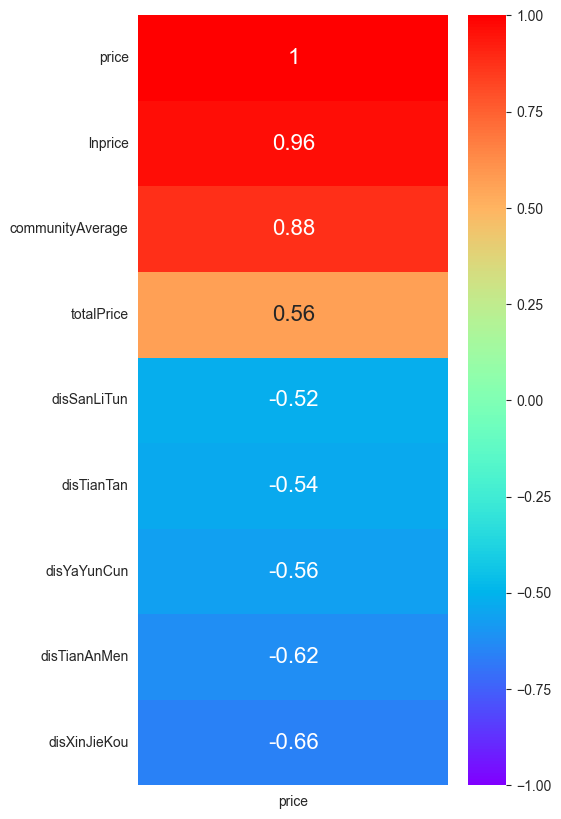

In [178]:
top_features = data_bandwidth.corr()[['price']].sort_values(by=['price'], ascending=False)
top_features = top_features[abs(top_features['price']) > 0.5]

plt.figure(figsize=(5,10))
sns.heatmap(top_features, cmap='rainbow', annot=True, annot_kws={"size": 16}, vmin=-1, vmax=1)


In [180]:
X = data_bandwidth[['tradedays','policy','communityAverage',
                    'district_10', 'subway_1.0',
                    'district_1', 'district_8',
                    'tradeYear', 'square',
                    'constructionTime', 'subway_0.0',
                    'district_6','disTianAnMen']]
X['tradedays'] = (data_bandwidth['tradedays'] - threshold_1).dt.days
X['tradedays*policy'] = X['tradedays'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['lnprice']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3702916190.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3702916190.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [181]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from sklearn.linear_model import Lasso, LassoCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Splitting data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardizing the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Using LassoCV to find the best alpha
lasso_cv = LassoCV(alphas=None, cv=10, max_iter=10000)
lasso_cv.fit(X_train_scaled, y_train)

# Displaying the best alpha
print("Best alpha using LassoCV: %f" % lasso_cv.alpha_)

# Fitting Lasso regression with best alpha
lasso = Lasso(alpha=lasso_cv.alpha_)
lasso.fit(X_train_scaled, y_train)

# Checking coefficients
coef = pd.Series(lasso.coef_, index=X.columns)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Displaying the coefficients
selected_features = coef[coef != 0].sort_values()
print(selected_features)

Best alpha using LassoCV: 0.000340
Lasso picked 11 variables and eliminated the other 4 variables
tradedays*policy   -0.158748
square             -0.035206
tradeYear          -0.013592
disTianAnMen       -0.012375
district_6         -0.006285
district_10        -0.001350
subway_1.0          0.000422
district_8          0.000864
policy              0.011256
tradedays           0.223337
communityAverage    0.327261
dtype: float64


In [182]:
X_filtered = X[selected_features.index]

In [188]:
X_filtered = X_filtered.astype(int)

In [189]:
model_4 = sm.OLS(y, X_filtered).fit()
print(model_4.summary())

                                 OLS Regression Results                                
Dep. Variable:                lnprice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.982e+07
Date:                Thu, 26 Oct 2023   Prob (F-statistic):                        0.00
Time:                        14:40:47   Log-Likelihood:                          7541.4
No. Observations:               79864   AIC:                                 -1.506e+04
Df Residuals:                   79854   BIC:                                 -1.497e+04
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

## Model 5: RDD for Policy after 1 Month at 4.17 with Control

In [191]:
threshold_2 = pd.Timestamp('2017-04-17')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold_2).astype(int)
df_DOM

,Lng,Lat,Cid,DOM,followers,totalPrice,price,square,kitchen,constructionTime,...,floortype_钢,floortype_顶,floortype_高,tradetime,policy,policy_lag_1_month,policy_lag_2_month,day_1,day_2,day_3
0,116.475489,40.019520,1111027376244,7.288928,4.672829,6.028279,31680,4.875197,1,2005,...,False,False,True,2016-08-09,0,0,0,-220,-251,-281
1,116.453917,39.881534,1111027381879,6.805723,4.844187,6.354370,43436,4.885677,1,2004,...,False,False,True,2016-07-28,0,0,0,-232,-263,-293
2,116.561978,39.877145,1111040862969,7.147559,3.891820,6.937314,52021,5.288267,1,2005,...,False,False,False,2016-12-11,0,0,0,-96,-127,-157
3,116.438010,40.076114,1111043185817,6.872128,4.934474,5.695414,22202,4.897840,1,2008,...,False,False,False,2016-09-30,0,0,0,-168,-199,-229
4,116.428392,39.886229,1111027381174,6.831954,5.659482,5.971262,48396,4.394449,1,1960,...,False,False,False,2016-08-28,0,0,0,-201,-232,-262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318846,116.546899,39.755236,1111027377053,0.000000,2.197225,5.857933,20580,5.136210,1,2003,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318847,116.497474,39.810115,1111027377957,0.000000,0.693147,4.689511,31006,3.557916,1,2009,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318848,116.497256,39.804081,1111027380056,0.000000,1.098612,5.883322,35138,4.626638,1,2000,...,False,False,False,2016-06-05,0,0,0,-285,-316,-346
318849,116.501794,39.799347,1111027377054,0.000000,1.609438,6.579251,40373,5.183692,1,2003,...,False,False,False,2016-06-12,0,0,0,-278,-309,-339


In [193]:
start_date = threshold_2 - pd.DateOffset(months=8)
end_date = threshold_2 + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
data_bandwidth['tradedays'] = data_bandwidth['tradetime']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3451860945.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [195]:
X = data_bandwidth[['tradedays', 'policy','communityAverage', 'totalPrice',
                    'district_10', 'subway_1.0',
                    'district_1', 'district_8',
                    'tradeYear', 'square',
                    'constructionTime', 'subway_0.0',
                    'district_6','disTianAnMen']]
X['tradedays'] = (data_bandwidth['tradedays'] - threshold_2).dt.days
X['tradedays*policy'] = X['tradedays'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['lnprice']
X_filtered = X[selected_features.index]
X_filtered = X_filtered.astype(int)

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2574719149.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2574719149.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [196]:
model_5 = sm.OLS(y, X_filtered).fit()
print(model_5.summary())

                                 OLS Regression Results                                
Dep. Variable:                lnprice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.869e+07
Date:                Thu, 26 Oct 2023   Prob (F-statistic):                        0.00
Time:                        14:42:04   Log-Likelihood:                          7892.0
No. Observations:               72865   AIC:                                 -1.576e+04
Df Residuals:                   72855   BIC:                                 -1.567e+04
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

## Model 6: RDD for Policy after 2 Month at 5.17 with Control

In [198]:
threshold_3 = pd.Timestamp('2017-05-17')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold_3).astype(int)
df_DOM

,Lng,Lat,Cid,DOM,followers,totalPrice,price,square,kitchen,constructionTime,...,floortype_钢,floortype_顶,floortype_高,tradetime,policy,policy_lag_1_month,policy_lag_2_month,day_1,day_2,day_3
0,116.475489,40.019520,1111027376244,7.288928,4.672829,6.028279,31680,4.875197,1,2005,...,False,False,True,2016-08-09,0,0,0,-220,-251,-281
1,116.453917,39.881534,1111027381879,6.805723,4.844187,6.354370,43436,4.885677,1,2004,...,False,False,True,2016-07-28,0,0,0,-232,-263,-293
2,116.561978,39.877145,1111040862969,7.147559,3.891820,6.937314,52021,5.288267,1,2005,...,False,False,False,2016-12-11,0,0,0,-96,-127,-157
3,116.438010,40.076114,1111043185817,6.872128,4.934474,5.695414,22202,4.897840,1,2008,...,False,False,False,2016-09-30,0,0,0,-168,-199,-229
4,116.428392,39.886229,1111027381174,6.831954,5.659482,5.971262,48396,4.394449,1,1960,...,False,False,False,2016-08-28,0,0,0,-201,-232,-262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318846,116.546899,39.755236,1111027377053,0.000000,2.197225,5.857933,20580,5.136210,1,2003,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318847,116.497474,39.810115,1111027377957,0.000000,0.693147,4.689511,31006,3.557916,1,2009,...,False,False,False,2016-06-10,0,0,0,-280,-311,-341
318848,116.497256,39.804081,1111027380056,0.000000,1.098612,5.883322,35138,4.626638,1,2000,...,False,False,False,2016-06-05,0,0,0,-285,-316,-346
318849,116.501794,39.799347,1111027377054,0.000000,1.609438,6.579251,40373,5.183692,1,2003,...,False,False,False,2016-06-12,0,0,0,-278,-309,-339


In [199]:
start_date = threshold_3 - pd.DateOffset(months=8)
end_date = threshold_3 + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
data_bandwidth['tradedays'] = data_bandwidth['tradetime']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2737231071.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [202]:
X = data_bandwidth[['tradedays', 'policy','communityAverage', 'totalPrice',
                    'district_10', 'subway_1.0',
                    'district_1', 'district_8',
                    'tradeYear', 'square',
                    'constructionTime', 'subway_0.0',
                    'district_6','disTianAnMen']]
X['tradedays'] = (data_bandwidth['tradedays'] - threshold_3).dt.days
X['tradedays*policy'] = X['tradedays'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['lnprice']
X_filtered = X[selected_features.index]
X_filtered = X_filtered.astype(int)

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3376623120.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3376623120.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [205]:
model_6 = sm.OLS(y, X_filtered).fit()
print(model_6.summary())

                                 OLS Regression Results                                
Dep. Variable:                lnprice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.700e+07
Date:                Thu, 26 Oct 2023   Prob (F-statistic):                        0.00
Time:                        14:42:33   Log-Likelihood:                          8479.3
No. Observations:               62356   AIC:                                 -1.694e+04
Df Residuals:                   62346   BIC:                                 -1.685e+04
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

# Summary of Policy Coefficients

In [206]:
models = [model_1, model_2, model_3, model_4, model_5, model_6]

coefs = [model.params['policy'] for model in models]
std_errs = [model.bse['policy'] for model in models]

def significance(star):
    if star < 0.01:
        return '***'
    elif star < 0.05:
        return '**'
    elif star < 0.1:
        return '*'
    else:
        return ''

stars = [significance(model.pvalues['policy']) for model in models]

df = pd.DataFrame({
    'Coefficient': coefs,
    'Std. Error': std_errs,
    'Significance': stars
})

df['Result'] = df.apply(lambda row: f"{row['Coefficient']:.4f}{row['Significance']} ({row['Std. Error']:.3f})", axis=1)
table = df[['Result']]
table = table.T
table.columns = [f"Model {i+1}" for i in range(len(coefs))]
table.insert(0, 'Variable', 'Policy effect')
print(table)



             Variable          Model 1            Model 2             Model 3  \
Result  Policy effect  0.0096* (0.006)  0.0177*** (0.006)  -0.0634*** (0.006)   

                  Model 4             Model 5             Model 6  
Result  0.0258*** (0.003)  -0.0542*** (0.004)  -0.1082*** (0.004)  


# Placebo Test

In [222]:
threshold = pd.Timestamp('2016-01-01')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold).astype(int)
start_date = threshold - pd.DateOffset(months=8)
end_date = threshold + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
X = data_bandwidth[['tradetime', 'policy']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2024386804.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2024386804.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [223]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     2668.
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:54:16   Log-Likelihood:            -1.3315e+06
No. Observations:              118724   AIC:                         2.663e+06
Df Residuals:                  118720   BIC:                         2.663e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const         4.03e+04    145.945    276.166      

In [227]:
X = data_bandwidth[['tradetime', 'policy', 'kitchen', 'constructionTime', 'square', 'ladderRatio', 'followers', 'DOM',
                    'buildingType_0.125', 'buildingType_0.25', 'buildingType_0.333', 'buildingType_0.429',
                    'buildingType_1.0', 'buildingType_2.0', 'buildingType_3.0', 'buildingType_4.0',
                    'renovationCondition_0', 'renovationCondition_1', 'renovationCondition_2', 'renovationCondition_3',
                    'renovationCondition_4']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']
X = X.astype(int)

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [228]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.135
Model:                            OLS   Adj. R-squared:                  0.135
Method:                 Least Squares   F-statistic:                     686.5
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:54:46   Log-Likelihood:            -8.1868e+05
No. Observations:               74835   AIC:                         1.637e+06
Df Residuals:                   74817   BIC:                         1.638e+06
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  5.663e+

In [231]:
threshold = pd.Timestamp('2015-03-01')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold).astype(int)
start_date = threshold - pd.DateOffset(months=8)
end_date = threshold + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
X = data_bandwidth[['tradetime', 'policy']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2706563698.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2706563698.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [232]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     153.0
Date:                Thu, 26 Oct 2023   Prob (F-statistic):           7.44e-99
Time:                        14:55:22   Log-Likelihood:            -8.2387e+05
No. Observations:               74835   AIC:                         1.648e+06
Df Residuals:                   74831   BIC:                         1.648e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        3.787e+04    196.145    193.091      

In [233]:
X = data_bandwidth[['tradetime', 'policy', 'kitchen', 'constructionTime', 'square', 'ladderRatio', 'followers', 'DOM',
                    'buildingType_0.125', 'buildingType_0.25', 'buildingType_0.333', 'buildingType_0.429',
                    'buildingType_1.0', 'buildingType_2.0', 'buildingType_3.0', 'buildingType_4.0',
                    'renovationCondition_0', 'renovationCondition_1', 'renovationCondition_2', 'renovationCondition_3',
                    'renovationCondition_4']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']
X = X.astype(int)

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [234]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.135
Model:                            OLS   Adj. R-squared:                  0.135
Method:                 Least Squares   F-statistic:                     686.5
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:55:25   Log-Likelihood:            -8.1868e+05
No. Observations:               74835   AIC:                         1.637e+06
Df Residuals:                   74817   BIC:                         1.638e+06
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  5.663e+

In [235]:
threshold = pd.Timestamp('2014-09-01')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold).astype(int)
start_date = threshold - pd.DateOffset(months=8)
end_date = threshold + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
X = data_bandwidth[['tradetime', 'policy']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\1746794574.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\1746794574.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [236]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     93.17
Date:                Thu, 26 Oct 2023   Prob (F-statistic):           3.97e-60
Time:                        14:55:56   Log-Likelihood:            -5.5851e+05
No. Observations:               51043   AIC:                         1.117e+06
Df Residuals:                   51039   BIC:                         1.117e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        3.512e+04    189.564    185.243      

In [237]:
X = data_bandwidth[['tradetime', 'policy', 'kitchen', 'constructionTime', 'square', 'ladderRatio', 'followers', 'DOM',
                    'buildingType_0.125', 'buildingType_0.25', 'buildingType_0.333', 'buildingType_0.429',
                    'buildingType_1.0', 'buildingType_2.0', 'buildingType_3.0', 'buildingType_4.0',
                    'renovationCondition_0', 'renovationCondition_1', 'renovationCondition_2', 'renovationCondition_3',
                    'renovationCondition_4']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']
X = X.astype(int)

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [238]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.144
Model:                            OLS   Adj. R-squared:                  0.144
Method:                 Least Squares   F-statistic:                     506.6
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:58:16   Log-Likelihood:            -5.5467e+05
No. Observations:               51043   AIC:                         1.109e+06
Df Residuals:                   51025   BIC:                         1.110e+06
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   5.14e+

In [239]:
threshold = pd.Timestamp('2013-05-01')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold).astype(int)
start_date = threshold - pd.DateOffset(months=8)
end_date = threshold + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
X = data_bandwidth[['tradetime', 'policy']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\4079387114.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\4079387114.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [240]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.092
Method:                 Least Squares   F-statistic:                     1808.
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:58:42   Log-Likelihood:            -5.8219e+05
No. Observations:               53744   AIC:                         1.164e+06
Df Residuals:                   53740   BIC:                         1.164e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        3.453e+04    149.402    231.118      

In [241]:
X = data_bandwidth[['tradetime', 'policy', 'kitchen', 'constructionTime', 'square', 'ladderRatio', 'followers', 'DOM',
                    'buildingType_0.125', 'buildingType_0.25', 'buildingType_0.333', 'buildingType_0.429',
                    'buildingType_1.0', 'buildingType_2.0', 'buildingType_3.0', 'buildingType_4.0',
                    'renovationCondition_0', 'renovationCondition_1', 'renovationCondition_2', 'renovationCondition_3',
                    'renovationCondition_4']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']
X = X.astype(int)

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [242]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.246
Model:                            OLS   Adj. R-squared:                  0.246
Method:                 Least Squares   F-statistic:                     973.9
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:59:06   Log-Likelihood:            -5.7718e+05
No. Observations:               53744   AIC:                         1.154e+06
Df Residuals:                   53725   BIC:                         1.155e+06
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  2.972e+

In [243]:
threshold = pd.Timestamp('2012-11-01')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold).astype(int)
start_date = threshold - pd.DateOffset(months=8)
end_date = threshold + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
X = data_bandwidth[['tradetime', 'policy']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\257723689.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\257723689.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [244]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.097
Model:                            OLS   Adj. R-squared:                  0.097
Method:                 Least Squares   F-statistic:                     1975.
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:59:35   Log-Likelihood:            -5.9026e+05
No. Observations:               55131   AIC:                         1.181e+06
Df Residuals:                   55127   BIC:                         1.181e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        2.775e+04    137.609    201.689      

In [245]:
X = data_bandwidth[['tradetime', 'policy', 'kitchen', 'constructionTime', 'square', 'ladderRatio', 'followers', 'DOM',
                    'buildingType_0.125', 'buildingType_0.25', 'buildingType_0.333', 'buildingType_0.429',
                    'buildingType_1.0', 'buildingType_2.0', 'buildingType_3.0', 'buildingType_4.0',
                    'renovationCondition_0', 'renovationCondition_1', 'renovationCondition_2', 'renovationCondition_3',
                    'renovationCondition_4']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']
X = X.astype(int)

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [246]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.239
Model:                            OLS   Adj. R-squared:                  0.239
Method:                 Least Squares   F-statistic:                     911.7
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:59:57   Log-Likelihood:            -5.8554e+05
No. Observations:               55131   AIC:                         1.171e+06
Df Residuals:                   55111   BIC:                         1.171e+06
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  2.739e+

In [247]:
threshold = pd.Timestamp('2011-08-01')
df_DOM['policy'] = (df_DOM['tradetime'] >= threshold).astype(int)
start_date = threshold - pd.DateOffset(months=8)
end_date = threshold + pd.DateOffset(months=8)
data_bandwidth = df_DOM[(df_DOM['tradetime'] >= start_date) & (df_DOM['tradetime'] <= end_date)]
X = data_bandwidth[['tradetime', 'policy']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2459876164.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\2459876164.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [248]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     41.99
Date:                Thu, 26 Oct 2023   Prob (F-statistic):           5.42e-27
Time:                        15:00:23   Log-Likelihood:            -1.3115e+05
No. Observations:               12424   AIC:                         2.623e+05
Df Residuals:                   12420   BIC:                         2.623e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const         2.64e+04    471.685     55.964      

In [249]:
X = data_bandwidth[['tradetime', 'policy', 'kitchen', 'constructionTime', 'square', 'ladderRatio', 'followers', 'DOM',
                    'buildingType_0.125', 'buildingType_0.25', 'buildingType_0.333', 'buildingType_0.429',
                    'buildingType_1.0', 'buildingType_2.0', 'buildingType_3.0', 'buildingType_4.0',
                    'renovationCondition_0', 'renovationCondition_1', 'renovationCondition_2', 'renovationCondition_3',
                    'renovationCondition_4']]
X['tradetime'] = (data_bandwidth['tradetime'] - threshold).dt.days
X['interaction'] = X['tradetime'] * X['policy']
X = sm.add_constant(X)
y = data_bandwidth['price']
X = X.astype(int)

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\86927\AppData\Local\Temp\ipykernel_17660\3837671869.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [250]:
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.118
Model:                            OLS   Adj. R-squared:                  0.117
Method:                 Least Squares   F-statistic:                     92.33
Date:                Thu, 26 Oct 2023   Prob (F-statistic):          4.49e-321
Time:                        15:00:41   Log-Likelihood:            -1.3043e+05
No. Observations:               12424   AIC:                         2.609e+05
Df Residuals:                   12405   BIC:                         2.610e+05
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                 -2768.32